# Test best model HCV 13 - rank 4 - 2102 rounds from PC on MAC 

- For HCV 13 : HCV larger and with minimum ressource in samples + long train to find best model 
  - use classical ressources = samples with min 90 days 
  - large search hyperparam
- Find best : 
  - Eval on 2000 rounds rank 1 to 5 mdl from HCV
  - Select best model with 2 criteria : 
    - rank highest : best behaviour at different time range so best generalization 
    - highest number of good model profit : > 333$/month on Test

- Results
  - Rank 4 round 2102+1 seems to be good on Train and Test with some criteria like not too bad Drawdown and continuity in increasing profit
    - best profit on Test
    - critics : but 7 months without profit on Train 

## Import & definitions

In [1]:
import os
import hashlib
import sys
from pathlib import Path
import re
import random
import time
import math
import itertools
from datetime import timedelta
from datetime import timezone
from datetime import datetime
import json
import joblib
# Third Party
import pickle
import pandas as pd
import numpy as np
from sklearn.metrics import precision_score, accuracy_score, f1_score
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import make_scorer
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split 
from sklearn.preprocessing import StandardScaler
from sklearn.experimental import enable_halving_search_cv  # noqa: F401
from sklearn.model_selection import HalvingRandomSearchCV
from sklearn.model_selection import TimeSeriesSplit
from scipy.stats import randint
from scipy.stats import uniform
import scipy.stats as stats
from scipy.stats.mstats import mquantiles
import xgboost as xgb
# from helpers.ocean_helpers import save_list
'''import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.callbacks import EarlyStopping
from keras.regularizers import L1L2'''
# PLOT
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns
sns.set_theme()
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
#sns.set_theme("notebook")
#mpl.style.use('seaborn-v0_8-ticks')
# definitions
DT_PAST = 5 # 5 min
PAST_HISTORY = int(6*60 / DT_PAST) #  6 hours in 5mins units : used to predict next values in future
FUTURE_TARGET = 12 + 3 # number of 5 min to predict  : 15 : 1h15
STEP = 1
BATCH_SIZE = 256 #128 #32
TRAIN_SPLIT_RATIO = 0.9 #0.8 #0.9891 # 1-(60/5*24)/50977
TARGET_NAME = "Close_ETH"
MODE_TRAIN_AE = True
target_level = 0.0045
R = 2 
'''
#LIST_SEEDS = [1,2,3,4,5]
LIST_SEEDS = [1]
MODE_AUTO_SELECT = 0 #1 #   #0 # 0: False, 1: True, 2: from disk
MODE_TRAIN_PREDICTOR = True # False

EPOCHS_AE = 1#30
PATIENCE_AE = 0#10
LIST_UNITS_ENC_AE = [64]
LIST_UNITS_AE = [16]
LIST_DROPOUT_AE = [0.2]

EPOCHS_PRED = 100#30
PATIENCE_PRED = 0#10
LIST_UNITS_PRED = [128]
LIST_DROPOUT_PRED = [0.2]

MODE_TRAIN_LSTM = False
'''
# paths
path_data = "data"
path_save_df_feat = os.path.join(path_data, "df_features_05m.csv")

path_save_pred_vals = os.path.join(path_data, "pred_vals.csv")
path_save_auto_select = os.path.join(path_data, "list_auto_select.csv")

path_scaler = os.path.join(path_data, "scaler.bin")
path_scaler_y = os.path.join(path_data, "scaler_y.bin")
path_scaler_enc = os.path.join(path_data, "scaler_enc.bin")
path_save_df_feat_std = os.path.join(path_data, "df_features_05m_std.csv")
path_X_train = os.path.join(path_data, 'X_train.dat')
path_X_train_sca = os.path.join(path_data, 'X_train_sca.dat')
path_df_prob_comb = os.path.join(path_data, 'df_prob_comb.csv')
path_df_prob_comb_2 = os.path.join(path_data, 'df_prob_comb_2.csv')
path_df_prob_comb_1b = os.path.join(path_data, 'df_prob_comb_1b.csv')
path_arr_corr_matrix_targets = os.path.join(
    path_data, 'arr_corr_matrix_targets.npy'
)
path_pca = os.path.join(path_data,"pca_model.pkl")
path_hash_pca = os.path.join(path_data, 'pca_hash.txt')

'''
path_mdl_autoencoder =  os.path.join(path_data, "mdl_autoencoder")
path_mdl_encoder  =  os.path.join(path_data, "mdl_encoder")
path_mdl_predict_lstm  =  os.path.join(path_data, "mdl_predict_lstm")
path_mdl_predict_autoenc_lstm  =  os.path.join(
    path_data, "mdl_predict_autoenc_lstm")
'''

'\npath_mdl_autoencoder =  os.path.join(path_data, "mdl_autoencoder")\npath_mdl_encoder  =  os.path.join(path_data, "mdl_encoder")\npath_mdl_predict_lstm  =  os.path.join(path_data, "mdl_predict_lstm")\npath_mdl_predict_autoenc_lstm  =  os.path.join(\n    path_data, "mdl_predict_autoenc_lstm")\n'

## Load 

In [2]:
# LOAD
#df_prob_comb_high_event = pd.read_pickle(os.path.join(path_data, 'df_prob_comb_high_event.pkl'))
#global_event_by_day = pd.read_pickle(os.path.join(path_data, 'global_event_by_day.pkl'))
df_combined_condition = pd.read_pickle(os.path.join(path_data, 'df_combined_condition.pkl'))
#df_prob_comb_high_event_test = pd.read_pickle(os.path.join(path_data, 'df_prob_comb_high_event_test.pkl'))
#global_event_by_day_test = pd.read_pickle(os.path.join(path_data, 'global_event_by_day_test.pkl'))
df_combined_condition_test = pd.read_pickle(os.path.join(path_data, 'df_combined_condition_test.pkl'))

df_targets = pd.read_pickle(os.path.join(path_data, "df_targets.pkl"))
df_targets_test = pd.read_pickle(os.path.join(path_data, "df_targets_test.pkl"))

with open(os.path.join(path_data, "list_df.pkl"), "rb") as f:
    list_df = pickle.load(f)

with open(os.path.join(path_data, "list_df_test.pkl"), "rb") as f:
    list_df_test = pickle.load(f)

In [5]:
# X train : df_combined_condition train
# X test: df_combined_condition_test

# Y train : high trade or not
y_comb = (list_df[0]["target_cat"] == "high")
# Y test 
y_comb_test = list_df_test[0]["target_cat"]== "high"

## Functions

In [6]:
# --- Define the new, simplified custom metric ---

def fun_nb_trade_fixed_window(y_true, y_pred):
    """
    Custom XGBoost metric to count 30-minute windows with at least one trade signal.
    Assumes each prediction corresponds to a 5-minute interval.
    
    Args:
        y_pred (np.ndarray): The array of predictions (0s and 1s).
        y_true (DMatrix): The DMatrix object with the true labels. We don't use it
                          for this specific metric, but it's part of the function signature.
    """
    window_size = 6  # 30 minutes / 5 minutes per data point

    # Calculate the number of full, non-overlapping windows we can form
    num_windows = len(y_pred) // window_size
    
    # If there are no full windows, the trade count is 0
    if num_windows == 0:
        return 0.0
    
    if y_pred.sum() == 0:
        return 0.0
    # Truncate y_pred to the largest size that is a multiple of window_size
    trunc_len = num_windows * window_size
    y_pred_truncated = y_pred[:trunc_len]

    # Reshape the predictions into a 2D array where each row is a 30-min window
    # The '-1' tells numpy to automatically calculate the number of rows
    pred_windows = y_pred_truncated.reshape(-1, window_size)

    # Sum the predictions in each window (each row)
    sum_in_windows = pred_windows.sum(axis=1)

    # Count how many windows have a sum of 1 or more (at least one trade signal)
    # The result of the boolean comparison is an array of True/False,
    # and .sum() counts the number of True values.
    total_trades = (sum_in_windows >= 1).sum()
    #precision_score(y_true, y_pred)
    # XGBoost custom metrics must return a list of (name, value) tuples
    return precision_score(y_true, y_pred) + 10*float(total_trades)


In [7]:
def fun_trade(total_trades, winrate, risk=250, R=1.23 ):
    return total_trades * risk * (winrate * (1 + R) - 1)

def fun_arr_trade(arr_trade, arr_winrate, risk=250, R=1.23):
    return arr_trade * risk * (arr_winrate * (1 + R) - 1)

def fun_trades_gain(y_true, y_pred):
    """
    Custom XGBoost metric to count 30-minute windows with at least one trade signal.
    Assumes each prediction corresponds to a 5-minute interval.
    
    Args:
        y_pred (np.ndarray): The array of predictions (0s and 1s).
        y_true (DMatrix): The DMatrix object with the true labels. We don't use it
                          for this specific metric, but it's part of the function signature.
    """
    risk = 250
    R = 1.23
    window_size = 6  # 30 minutes / 5 minutes per data point

    # Calculate the number of full, non-overlapping windows we can form
    num_windows = len(y_pred) // window_size
    
    # If there are no full windows, the trade count is 0
    if num_windows == 0:
        return 0.0
    if y_pred.sum() == 0:
        return 0.0
    
    # Truncate y_pred to the largest size that is a multiple of window_size
    trunc_len = num_windows * window_size
    y_pred_truncated = y_pred[:trunc_len]

    # Reshape the predictions into a 2D array where each row is a 30-min window
    # The '-1' tells numpy to automatically calculate the number of rows
    pred_windows = y_pred_truncated.reshape(-1, window_size)

    # Sum the predictions in each window (each row)
    sum_in_windows = pred_windows.sum(axis=1)

    # Count how many windows have a sum of 1 or more (at least one trade signal)
    # The result of the boolean comparison is an array of True/False,
    # and .sum() counts the number of True values.
    total_trades = (sum_in_windows >= 1).sum()
    #precision_score(y_true, y_pred)
    winrate = precision_score(y_true, y_pred)
    #total_gain = total_trades * risk * (winrate * (1 + R) - 1)
    total_gain = fun_trade(total_trades, winrate, risk, R )
    # XGBoost custom metrics must return a list of (name, value) tuples
    return total_gain #precision_score(y_true, y_pred) + 10*float(total_trades)


In [8]:
def fun_plot_trades_gain(arr_eval, arr_eval_train, title_str="XBGBoost model performance : total gain"):
    fig = make_subplots(
        rows=2, 
        cols=1, 
        shared_xaxes=True, 
        vertical_spacing=0.03
    )

    fig.add_trace(
        go.Scatter(y=arr_eval["fun_trades_gain"], name="total_gain test"),
        row=1,
        col=1,
    )
    fig.add_trace(
        go.Scatter(y=arr_eval_train["fun_trades_gain"], name="total_gain train"),
        row=1,
        col=1,
    )
    fig.update_layout(
        height=600,
        template="plotly_white",
        title=title_str,
        hovermode='x unified'
    )
    fig.update_xaxes(
        showspikes=True, 
        spikemode='across', 
        spikesnap='cursor',
        spikethickness=1,
        spikedash='dot'
    )

    # Optional: Add y-axis spikes for more context
    fig.update_yaxes(showspikes=True, spikedash='dot')

    fig.show()

In [9]:
def fun_decoded_nb_trade_fixed_window(arr_in):
    # arr_in = np.array(precision_score(y_true, y_pred) + 10*float(total_trades))
    return np.int64(arr_in/10), arr_in%10

def fun_winrate(nb_trade, gain=333, risk=250, R=1.23):
    return (gain / (nb_trade * risk)+1) /(1 + R)

def fun_arr_winrate(arr_nb_trade, gain=333, risk=250, R=1.23):
    return (gain / (arr_nb_trade * risk)+1) /(1 + R)


In [10]:
def plot_trading_performance(df_trades, df_feat_tot, monthly_target=333):
    """
    Generates an interactive Plotly chart analyzing trading performance.

    Args:
        df_trades (pd.DataFrame): DataFrame with columns 'capital' and 'Train' (bool).
                                  Index must be DatetimeIndex.
        df_feat_tot (pd.DataFrame): DataFrame with column 'Close_ETH_raw'.
                                    Index must be DatetimeIndex.
        monthly_target (float): Target monthly gain in $ for the benchmark curve.
                                Default is 333.

    Returns:
        plotly.graph_objects.Figure: The generated figure.
    """
    
    # --- 1. Calculate Global Statistics for Title ---
    
    # Split the data
    df_train = df_trades[df_trades["Train"]]
    df_test = df_trades[~df_trades["Train"]]

    # Constants
    SECONDS_PER_MONTH = 30.44 * 24 * 60 * 60

    def calculate_mean_monthly_gain(df):
        if df.empty: return 0
        total_pnl = df["capital"].iloc[-1] - df["capital"].iloc[0]
        duration = (df.index[-1] - df.index[0]).total_seconds()
        if duration > 0:
            # PnL / (Duration in Months)
            return total_pnl / (duration / SECONDS_PER_MONTH)
        return 0

    mean_train_gain = calculate_mean_monthly_gain(df_train)
    mean_test_gain = calculate_mean_monthly_gain(df_test)

    plot_title = (
        f"<span style='font-size: 14px;'>Global Mean Monthly Gain: "
        f"<b>Train ${mean_train_gain:,.2f}/mo</b> | "
        f"<b>Test ${mean_test_gain:,.2f}/mo</b></span>"
    )

    # --- 2. Calculate Monthly Metrics ---

    # A. Monthly Reset Min Gain Curve
    # Groups by month, starts at actual capital, adds linear growth of monthly_target
    min_gain_pieces = []
    for period, group in df_trades.groupby(pd.Grouper(freq='MS')):
        if group.empty: continue
        start_capital = group.iloc[0]['capital']
        start_date = group.index[0]
        time_elapsed = (group.index - start_date).total_seconds()
        monthly_values = start_capital + (time_elapsed / SECONDS_PER_MONTH) * monthly_target
        min_gain_pieces.append(pd.Series(monthly_values, index=group.index))

    min_gain_series = pd.concat(min_gain_pieces) if min_gain_pieces else pd.Series(dtype=float)

    # B. Monthly Return (Absolute $)
    monthly_return_abs = df_trades.groupby(pd.Grouper(freq='MS'))['capital'].apply(
        lambda x: (x.iloc[-1] - x.iloc[0]) if len(x) > 0 else 0
    )

    # C. Monthly Max Drawdown (%)
    monthly_drawdown_pct = df_trades.groupby(pd.Grouper(freq='MS'))['capital'].apply(
        lambda x: (x / x.cummax() - 1).min() * 100 if len(x) > 0 else 0
    )

    # --- 3. Create Subplots ---
    fig = make_subplots(
        rows=2, cols=1,
        shared_xaxes=True,
        vertical_spacing=0.08,
        row_heights=[0.60, 0.40],
        # Enable secondary_y for both rows to handle different scales
        specs=[[{"secondary_y": True}], [{"secondary_y": True}]],
        subplot_titles=("Capital vs. Targets", "Monthly Performance: Drawdown (%) vs Return ($)")
    )

    # --- 4. Row 1: Capital & ETH ---

    # Train Capital
    if not df_train.empty:
        fig.add_trace(go.Scatter(
            x=df_train.index,
            y=df_train["capital"],
            mode='lines+markers',
            name='Train Capital',
            line=dict(width=1),
            marker=dict(size=3)
        ), row=1, col=1)

    # Test Capital
    if not df_test.empty:
        fig.add_trace(go.Scatter(
            x=df_test.index,
            y=df_test["capital"],
            mode='lines+markers',
            name='Test Capital',
            line=dict(width=1),
            marker=dict(size=3)
        ), row=1, col=1)

    # Min Gain Benchmark
    fig.add_trace(go.Scatter(
        x=min_gain_series.index,
        y=min_gain_series,
        mode='lines',
        name=f'Min Gain (${monthly_target}/mo)',
        line=dict(color='green', width=2, dash='solid'),
        opacity=0.6
    ), row=1, col=1)

    # ETH Price (Secondary Y-Axis)
    fig.add_trace(go.Scatter(
        x=df_feat_tot.index,
        y=df_feat_tot["Close_ETH_raw"],
        mode='lines',
        name='ETH Price',
        line=dict(color='grey', width=1, dash='dot')
    ), row=1, col=1, secondary_y=True)

    # --- 5. Row 2: Drawdown (%) & Return ($) ---

    # Trace 1: Max Drawdown % (Left Axis)
    fig.add_trace(go.Bar(
        x=monthly_drawdown_pct.index,
        y=monthly_drawdown_pct.values,
        name='Max Drawdown %',
        marker_color='crimson',
        opacity=0.4,
        text=[f"{val:.1f}%" for val in monthly_drawdown_pct.values],
        textposition='inside',
        textfont=dict(size=11, color='white'),
        hovertemplate='%{x|%b %Y}<br>Drawdown: %{y:.2f}%<extra></extra>'
    ), row=2, col=1, secondary_y=False)

    # Trace 2: Monthly Return $ (Right Axis)
    # Color logic: Green for positive, Red for negative
    colors = ['#00CC96' if val >= 0 else '#EF553B' for val in monthly_return_abs.values]

    fig.add_trace(go.Bar(
        x=monthly_return_abs.index,
        y=monthly_return_abs.values,
        name='Monthly Return $',
        marker_color=colors,
        opacity=0.8,
        text=[f"{val:+.0f}$" for val in monthly_return_abs.values],
        textposition='outside',
        textangle=-90,
        textfont=dict(size=14, color='green'),
        cliponaxis=False,
        hovertemplate='%{x|%b %Y}<br>PnL: %{y:+.2f}$<extra></extra>'
    ), row=2, col=1, secondary_y=True)

    # --- 6. Update Layout ---
    fig.update_layout(
        title=plot_title,
        width=1200,
        height=700,
        template="plotly_white",
        legend=dict(yanchor="top", y=0.99, xanchor="left", x=0.01),
        margin=dict(b=100) # Extra bottom margin for vertical text
    )

    # Row 1 Axes Labels
    fig.update_yaxes(title_text="Capital [$]", row=1, col=1, secondary_y=False)
    fig.update_yaxes(title_text="ETH Price [$]", row=1, col=1, secondary_y=True)

    # Row 2 Axes Labels & Styling
    fig.update_yaxes(title_text="Drawdown [%]", row=2, col=1, secondary_y=False, color='crimson')
    fig.update_yaxes(title_text="Monthly Return [$]", row=2, col=1, secondary_y=True, color='black')
    
    # Add a zero line for the return chart
    fig.update_yaxes(zeroline=True, zerolinewidth=1, zerolinecolor='black', row=2, col=1)

    return fig

In [11]:
def fun_arr_winrate(arr_nb_trade, gain, risk, R):
    """Mock function to simulate win rate calculation."""
    # This is a placeholder to make the example runnable.
    # The formula is derived from a common trading gain formula.
    return (gain / arr_nb_trade + risk) / (risk * (1 + R))

# --- Updated plotting function ---

def fun_plot_pre_trade(df, gain_period_min=333, gain_period_bingo=1000):

    arr_nb_trade_winrate_train = np.linspace(max(1, min(df["trades_train"])), max(df["trades_train"]), 100)
    arr_winrate_min_train = fun_arr_winrate(arr_nb_trade_winrate_train, gain=gain_period_min, risk=250, R=1.23)
    arr_winrate_bingo_train = fun_arr_winrate(arr_nb_trade_winrate_train, gain=gain_period_bingo, risk=250, R=1.23)

    # --- Create the Plot with opacity for the test data ---
    fig = px.scatter(
        df,
        x='trades_test',
        y='precision_test',
        title="Evaluation Precision vs. Number of Trades",
        color_discrete_sequence=["#3CB620"], # Green for test data
        opacity=0.6,  # Added opacity for the main scatter plot
    )
    # Customize the hover template
    fig.update_traces(
            hovertemplate="Run Index: %{customdata[0]}<br>" +
                "Gain Train: %{customdata[1]:.2f}<br>" +
                "Trades Train: %{customdata[3]:.2f}<br>" +
                "Winrate Train: %{customdata[4]:.4f}<br>" +
                "<b>Gain Test: %{customdata[2]:.2f}</b><br>" +
                "Trades Test: %{x:.2f}<br>" +
                "Winrate Test: %{y:.4f}<br>" + # Corrected from Winrate Train
                    "<extra></extra>",
            customdata=df[['run_index', 'gain_train', "gain_test", "trades_train", "precision_train"]],
            name="test" # Assign a name for the legend
    )

    # add precision = f(nb_trade) to have a gain = 333/mth
    fig.add_scatter(
        x=arr_nb_trade_winrate_train,
        y=arr_winrate_min_train,
        mode='lines',
        line=dict(color='red', width=2),
        line_dash="dash",
        name="333$/mth Precision",
        hovertemplate=f"Gain: {gain_period_min:.2f}<br>" +
                    "Number of Trades: %{x}<br>" +
                    "Precision: %{y:.4f}<br>" +
                    "<extra></extra>",
    )
    # add precision = f(nb_trade) to have a gain = 1000/mth
    fig.add_scatter(
        x=arr_nb_trade_winrate_train,
        y=arr_winrate_bingo_train,
        mode='lines',
        line=dict(color='blue', width=2),
        line_dash="dash",
        name="1000$/mth Precision",
        hovertemplate=f"Gain: {gain_period_bingo:.2f}<br>" +
                    "Number of Trades: %{x}<br>" +
                    "Precision: %{y:.4f}<br>" +
                    "<extra></extra>",
    )
    # add train data with opacity
    fig.add_trace(
        go.Scatter(
            x=df["trades_train"],
            y=df["precision_train"],
            name="train",
            mode="markers",
            # Added marker dict to set color and opacity for the train data
            marker=dict(
                color="#FF7F0E", # Orange for train data
                opacity=0.6
            ),
            hovertemplate="Run Index: %{customdata[0]}<br>" +
                "<b>Gain Train: %{customdata[1]:.2f}</b><br>" +
                "Trades Train: %{x:.2f}<br>" +
                "Winrate Train: %{y:.4f}<br>" +
                "Gain Test: %{customdata[2]:.2f}<br>" +
                "Trades Test: %{customdata[3]:.2f}<br>" +
                "Winrate Test: %{customdata[4]:.4f}<br>" +
                    "<extra></extra>",
            customdata=df[['run_index', 'gain_train', "gain_test", "trades_test", "precision_test"]],
        )
    )

    fig.update_layout(
        xaxis_title="Number of Trades / mth",
        yaxis_title="Precision",
        font=dict(family="Arial, sans-serif", size=14),
        height=600,
        legend_title_text='Data Type' # Add a title to the legend
    )

    fig.show()



In [12]:
def fun_plot_xgb_rounds(df, gain_period_min=333, gain_period_bingo=1000):
    """
    Plots XGBoost model performance with semi-transparent markers.
    """
    layout = dict(
        hoversubplots="axis",
        title=dict(text="XBGBoost model performance"),
        hovermode="x",
        grid=dict(rows=3, columns=1),
        height=600,
        xaxis_title="XGB Rounds",
        yaxis=dict(
            title="Trades"
        ),
        yaxis2=dict(
            title="Precision"
        ),
        yaxis3=dict(
            title="Gain"
        )
    )

    # Define marker styles for train and test to reduce repetition
    # The 'opacity' property (from 0 to 1) controls the alpha effect.
    train_marker = dict(color="blue", opacity=0.5)
    test_marker = dict(color="red", opacity=0.5)

    data = [
        go.Scatter(x=df["run_index"], y=df["trades_train"], xaxis="x", yaxis="y", name="trades train", mode="markers", marker=train_marker),
        go.Scatter(x=df["run_index"], y=df["trades_test"], xaxis="x", yaxis="y", name="trades test",  mode="markers", marker=test_marker),
        go.Scatter(x=df["run_index"], y=df["precision_train"], xaxis="x", yaxis="y2", name="pre train",  mode="markers", marker=train_marker),
        go.Scatter(x=df["run_index"], y=df["precision_test"], xaxis="x", yaxis="y2", name="pre test",  mode="markers", marker=test_marker),
        go.Scatter(x=df["run_index"], y=df["gain_train"], xaxis="x", yaxis="y3", name="gain train",  mode="markers", marker=train_marker),
        go.Scatter(x=df["run_index"], y=df["gain_test"], xaxis="x", yaxis="y3", name="gain test",  mode="markers", marker=test_marker),
    ]

    fig = go.Figure(data=data, layout=layout)

    fig.add_hline(
        y=gain_period_min,
        xref="x",
        yref="y3",
        line_dash="dot",
        line=dict(color='red', width=2),
        annotation_text=f"Gain: {gain_period_min:.2f}$/mth",
        annotation_position="bottom right",
        annotation_font_color="red",
        annotation_font_size=8,
        row=3,
        col=1,
    )
    fig.add_hline(
        y=gain_period_bingo,
        xref="x",
        yref="y3",
        line_dash="dot",
        annotation_text=f"Gain: {gain_period_bingo:.2f}$/mth",
        annotation_position="top right",
        annotation_font_color="blue",
        annotation_font_size=8,
        row=3,
        col=1,
    )
    fig.update_xaxes(
        showspikes=True,
        spikemode='across',
        spikesnap='cursor',
        spikethickness=1,
        spikedash='dot',
    )
    fig.show()




In [13]:
r_period_test = 1/ (y_comb_test.shape[0]/(30*288))
r_period_train = 1/ (y_comb.shape[0]/(30*288))

In [14]:
# from CV : objective="binary:hinge", scoring="precision", min_resources=500,
# Best Score (Accuracy): 0.3451
#   colsample_bytree: 0.4145
#   learning_rate: 0.5959
#   max_depth: 2
#   reg_alpha: 0.0718
#   reg_lambda: 0.6826
#   subsample: 0.4177
best_params_= {}
best_params_["colsample_bytree"] = 0.4145
best_params_["learning_rate"] = 0.5959
best_params_["max_depth"] = 2
best_params_["reg_alpha"] = 0.0718
best_params_["reg_lambda"] = 0.6826
best_params_["subsample"] = 0.4177


## XGBoost

### Rank 4

In [15]:
params_ = {
 'colsample_bytree': np.float64(0.7580600333203613), 
 'learning_rate': np.float64(0.4101814775892799), 
 'max_depth': np.int64(2), 
 'reg_alpha': np.float64(4.381100323866391), 
 'reg_lambda': np.float64(1.633764278202432), 
 'subsample': np.float64(0.5572247810893609),
}

### Backtest

In [16]:
df_feat_tot = pd.concat((list_df[0], list_df_test[0]))

In [17]:
gain_period_min = 333
gain_period_bingo = 1000

#### Baseline

target level for TP [-]:  0.0045
R TP/SL [-]:  2
r_fees %fees/%TP [-]:  0.17200000000000001
R_eq [-]:  1.2321428571428572
leverage [-]:  8.269576962347873
Gain for one TP [$]:  307.9804229342824
Loss for one SL [$]:  -250.0
Capital init [$] 10000
final capital [$]: -2794488.301003885
ratio gain final [-]:  -280.4488301003885
Winrate [-] :  0.29361825485567566
nb_tp:  14180
capital_tp [$]:  4367162.397206699
nb_sl:  28946
capital_sl [$]:  -7236500.0
nb_neutral:  5168
capital_neutral [$] 64849.30178884704


,type,date_open,buy,sell,gain,fees,capital
2023-01-01 01:15:00,Neutral,2023-01-01 00:00:00,1194.540039,1194.369995,-75.773794,64.001970,9.924226e+03
2023-01-01 02:40:00,Neutral,2023-01-01 01:20:00,1193.660034,1195.109985,36.406005,64.045400,9.960632e+03
2023-01-01 04:05:00,Neutral,2023-01-01 02:45:00,1194.290039,1196.010010,55.042660,64.052616,1.001567e+04
2023-01-01 05:30:00,Neutral,2023-01-01 04:10:00,1195.829956,1196.160034,-41.189318,64.015359,9.974486e+03
2023-01-01 06:55:00,Neutral,2023-01-01 05:35:00,1196.170044,1197.160034,4.408765,64.033013,9.978894e+03
...,...,...,...,...,...,...,...
2025-10-31 14:05:00,SL,2025-10-31 13:55:00,3891.370000,3882.614417,-250.000000,63.934518,-2.794046e+06
2025-10-31 14:45:00,SL,2025-10-31 14:10:00,3883.090000,3874.353048,-250.000000,63.934518,-2.794296e+06
2025-10-31 14:55:00,SL,2025-10-31 14:50:00,3878.430000,3869.703532,-250.000000,63.934518,-2.794546e+06
2025-10-31 15:10:00,SL,2025-10-31 15:00:00,3861.080000,3852.392570,-250.000000,63.934518,-2.794796e+06


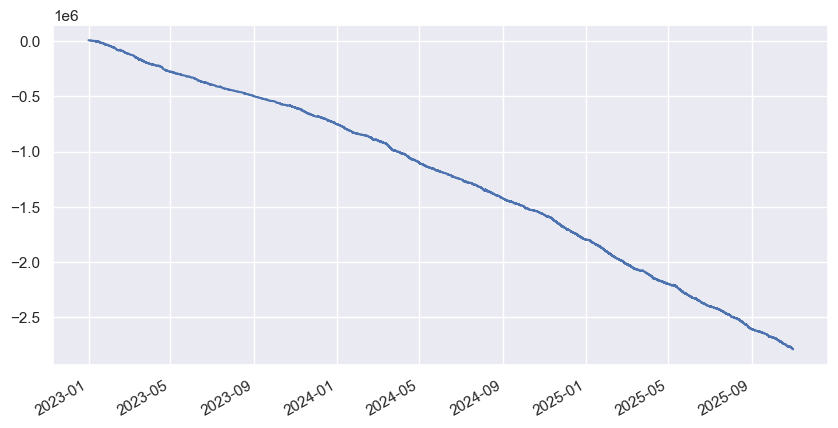

In [18]:
# 
capital_init = 10000
# strategy
step_max = FUTURE_TARGET # 1h15
tp_ratio = target_level #0.45/100 #0.1 / 100 #0.33/100
risk_ratio = 2.5/100

# trading platform
ratio_fees = 0.0774 / 100 # hyperliquid

# display
print("target level for TP [-]: ", tp_ratio)
print("R TP/SL [-]: ", R)
print("r_fees %fees/%TP [-]: ", ratio_fees / tp_ratio)
R_eq = (tp_ratio - ratio_fees) / ((tp_ratio / R) + ratio_fees)
print("R_eq [-]: ", R_eq)

def backtest(df_, capital_init, step_max, 
             tp_ratio, risk_ratio, ratio_fees, R,
             trade_signal=None):
    # leverage calculation 
    #leverage = (capital_init * risk_ratio * R / tp_ratio) / capital_init
    leverage = risk_ratio /  (tp_ratio / R + ratio_fees * (1 - tp_ratio / (2 * R)))
    print('leverage [-]: ', leverage)

    # TP calculation
    fees_tp = ((1+tp_ratio) + 1) / 2 * leverage * capital_init * ratio_fees
    gain_tp = tp_ratio * leverage * capital_init - fees_tp
    # SL calculation
    fees_sl = (1 + 1-1/R*tp_ratio) / 2 * leverage * capital_init * ratio_fees
    gain_sl = -1/R*tp_ratio * leverage * capital_init - fees_sl
    print("Gain for one TP [$]: ", gain_tp)
    print("Loss for one SL [$]: ", gain_sl)
    # simulation: initialisation
    if trade_signal is None:
        buy = df_["Close_ETH_raw"].values[0] # for first trade
        list_buy = [buy]
        list_trade_date_open = [df_["Close_ETH_raw"].index[0]]
        neutral = False
    else:
        list_buy = []
        list_trade_date_open = []
        neutral = True
    tp = False
    nb_tp = 0
    capital_tp = 0
    sl = False
    nb_sl = 0
    capital_sl = 0
    
    nb_neutral = 0
    capital_neutral = 0
    capital = capital_init
    step = 0
    list_trade_gain = []
    list_trade_date = []
    list_trade_type = []
    list_trade_fees = []
    list_capital = []
    list_sell = []
    
    #list_buy.append(buy)
    # simulation calculation
    for close, high, low, date_trade in zip(
            df_["Close_ETH_raw"], 
            df_["Close_ETH_raw"] * df_["High_ETH"], 
            df_["Close_ETH_raw"] * df_["Low_ETH"],
            df_["Close_ETH_raw"].index
        ):
        
        # NEUTRAL : if elasted time to take a trade is over (more than 1 hour) : we close the position
        if step >= step_max:
            nb_neutral += 1
            fees = ( (buy + close) / 2 ) / buy * leverage * capital_init * ratio_fees
            gain = ((close - buy) / buy) * leverage * capital_init - fees
            list_trade_fees.append(fees)
            list_trade_gain.append(gain)
            list_trade_date.append(date_trade)
            list_sell.append(close)
            list_trade_type.append("Neutral")
            capital += gain
            list_capital.append(capital)
            capital_neutral += gain
            neutral = True
            step = 0
            continue

        # if trade_signal is not None:
        #     if trade_signal.at[date_trade] == True:
        #         print("Trade possible at ", date_trade)

        # if last time, we have close a position or no trade opened
        if tp or sl or neutral:
            if trade_signal is not None:
                try:
                    if trade_signal.at[date_trade] == True:
                        pass
                except:
                    print(date_trade, "is not in trade_signal")

            # if no signal used,  we open a new one immediatly (5 min after)
            if trade_signal is None:
                buy = close
                list_trade_date_open.append(date_trade)
                list_buy.append(buy)
                step = 0
                tp = False
                sl = False
                neutral = False
                continue # trade done at close
            # if trade signal is True
            elif np.any(trade_signal.at[date_trade]):
                #print("Trade opened at ", date_trade)
                buy = close
                list_trade_date_open.append(date_trade)
                list_buy.append(buy)
                step = 0
                tp = False
                sl = False
                neutral = False
                continue # trade done at close
            # if no trade signal => no trade opened
            else:
                tp = False
                sl = False
                neutral = True # to be able to check next time
                step = 0
                continue
        # TP : if max price is higher than TP, we take the trade and close position
        if high >= (1+tp_ratio) * buy:
            fees = fees_tp
            gain = gain_tp
            list_trade_fees.append(fees)
            list_trade_gain.append(gain)
            list_trade_date.append(date_trade)
            list_sell.append((1+tp_ratio)*buy)
            list_trade_type.append("TP")
            capital += gain
            list_capital.append(capital)
            capital_tp += gain
            tp = True
            nb_tp += 1
            continue
        # SL : if min price is lower than SL, we take the trade and close position
        elif low <= (1-1/R*tp_ratio) * buy: 
            fees = fees_sl
            gain = gain_sl
            list_trade_fees.append(fees)
            list_trade_gain.append(gain)
            list_trade_date.append(date_trade)
            list_sell.append((1-1/R*tp_ratio)*buy)
            list_trade_type.append("SL")
            capital +=  gain
            list_capital.append(capital)
            capital_sl +=  gain
            sl = True
            nb_sl += 1
            continue
        # no trade
        else:
            step += 1
    # results
    if trade_signal is not None:
        print("trade signal used, adding last buy & date_open")
        list_trade_date_open.append(df_["Close_ETH_raw"].index[-1])
        #list_buy.append(buy)
    if len(list_buy) > len(list_trade_date):
        list_buy = list_buy[:len(list_trade_date)]
    if len(list_trade_date_open) > len(list_trade_date):
        list_trade_date_open = list_trade_date_open[:len(list_trade_date)]
    df_trades = pd.concat([
        pd.Series(list_trade_type, index=list_trade_date, name="type"),
        pd.Series(list_trade_date_open, index=list_trade_date, name="date_open"),
        pd.Series(list_buy, index=list_trade_date, name="buy"),
        pd.Series(list_sell, index=list_trade_date, name="sell"),
        pd.Series(list_trade_gain, index=list_trade_date, name="gain"),
        pd.Series(list_trade_fees, index=list_trade_date, name="fees"),
        pd.Series(list_capital, index=list_trade_date, name="capital"),
        ],
        axis=1,
    )
    return df_trades, capital, nb_tp, nb_sl, nb_neutral, capital_tp, capital_sl, capital_neutral

df_trades, capital, nb_tp, nb_sl, nb_neutral, capital_tp, capital_sl, capital_neutral = (
    backtest(df_feat_tot, capital_init, step_max, tp_ratio, risk_ratio, ratio_fees, R)
)

print("Capital init [$]", capital_init)
print('final capital [$]:', capital)
print("ratio gain final [-]: ", (capital - capital_init)/capital_init)
print("Winrate [-] : ", nb_tp / (nb_tp + nb_sl + nb_neutral))
print("nb_tp: ", nb_tp)
print('capital_tp [$]: ', capital_tp)
print("nb_sl: ", nb_sl)
print('capital_sl [$]: ', capital_sl)
print('nb_neutral: ', nb_neutral)
print('capital_neutral [$]', capital_neutral)

# final capital [$]: -2794488.301003885 # baseline
df_trades["capital"].plot(kind="line", figsize=(10, 5))
df_trades

#### XGB : 2102+1

{'colsample_bytree': np.float64(0.7580600333203613), 'learning_rate': np.float64(0.4101814775892799), 'max_depth': np.int64(2), 'reg_alpha': np.float64(4.381100323866391), 'reg_lambda': np.float64(1.633764278202432), 'subsample': np.float64(0.5572247810893609)}
Model loaded.


/var/folders/m4/ng3wlwj109df2b8j9f4y4m7m0000gn/T/ipykernel_19493/3794277309.py:47: UserWarning: [07:56:29] WARNING: /Users/runner/work/xgboost/xgboost/src/gbm/gbtree.cc:384: Changing updater from `grow_gpu_hist` to `grow_quantile_histmaker`.
  xgb_mdl_long = pickle.load(open(os.path.join(path_data,'xgb_mdl_13_04best_2102.pkl'), 'rb'))
/var/folders/m4/ng3wlwj109df2b8j9f4y4m7m0000gn/T/ipykernel_19493/3794277309.py:47: UserWarning: [07:56:29] WARNING: /Users/runner/work/xgboost/xgboost/src/context.cc:203: XGBoost is not compiled with CUDA support.
  xgb_mdl_long = pickle.load(open(os.path.join(path_data,'xgb_mdl_13_04best_2102.pkl'), 'rb'))


Accuracy on training data: 0.7553097081152028
Accuracy on test data: 0.7205585464333782
For Model XGBoost: 
precision TRAIN: 0.567
% possible trades : 0.57
nb trade per day : 1.64
precision TEST: 0.526
% possible trades : 0.39
nb trade per day : 1.12


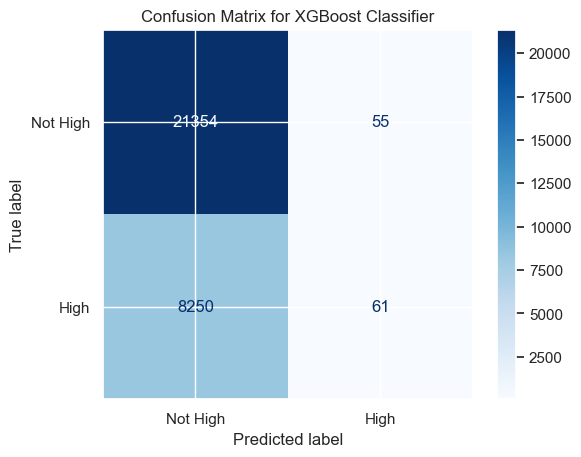

nb good mdl :  162
Accuracy on training data: 0.7553097081152028
Accuracy on test data: 0.7205585464333782
leverage [-]:  8.269576962347873
Gain for one TP [$]:  307.9804229342824
Loss for one SL [$]:  -250.0
2024-12-12 13:00:00 is not in trade_signal
2024-12-12 13:00:00 is not in trade_signal
trade signal used, adding last buy & date_open
Capital init [$] 10000
final capital [$]: 40060.01586098298
ratio gain final [-]:  3.0060015860982983
Winrate [-] :  0.5057618437900128
nb_tp:  395
capital_tp [$]:  121652.26705904206
nb_sl:  364
capital_sl [$]:  -91000.0
nb_neutral:  22
capital_neutral [$] -592.2511980583631


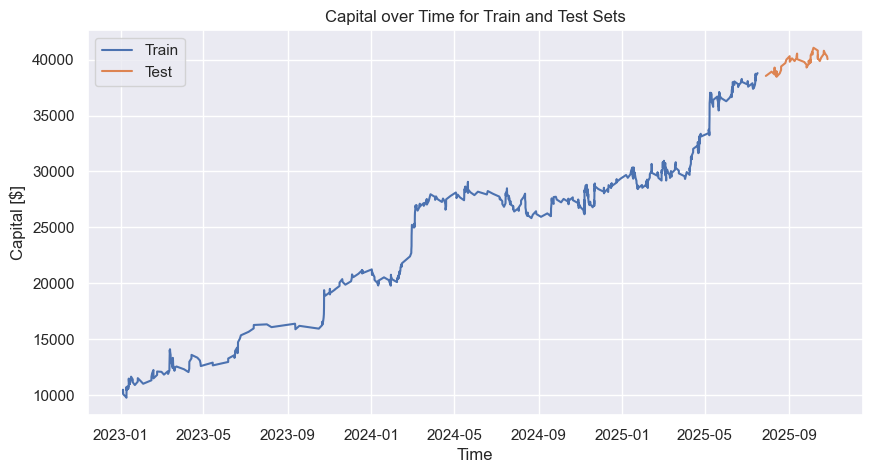

,type,date_open,buy,sell,gain,fees,capital,Train
2023-01-04 02:10:00,Neutral,2023-01-04 00:50:00,1249.660034,1252.910034,150.977737,64.089757,10150.977737,True
2023-01-04 02:25:00,TP,2023-01-04 02:15:00,1252.880005,1258.517965,307.980423,64.150540,10458.958160,True
2023-01-04 04:35:00,Neutral,2023-01-04 03:15:00,1251.050049,1249.579956,-161.143651,63.968919,10297.814508,True
2023-01-04 13:00:00,SL,2023-01-04 12:40:00,1265.380005,1262.532900,-250.000000,63.934518,10047.814508,True
2023-01-08 17:25:00,SL,2023-01-08 17:20:00,1286.680054,1283.785024,-250.000000,63.934518,9797.814508,True
...,...,...,...,...,...,...,...,...
2025-10-21 09:00:00,TP,2025-10-21 08:55:00,3970.800000,3988.668600,307.980423,64.150540,40502.035438,False
2025-10-21 15:30:00,TP,2025-10-21 15:25:00,3920.900000,3938.544050,307.980423,64.150540,40810.015861,False
2025-10-23 12:10:00,SL,2025-10-23 11:45:00,3911.540000,3902.739035,-250.000000,63.934518,40560.015861,False
2025-10-26 08:50:00,SL,2025-10-26 08:45:00,4077.150000,4067.976413,-250.000000,63.934518,40310.015861,False


In [19]:
#xgb_mdl_long = pickle.load(open(os.path.join(path_data,'xgb_mdl_13_03.pkl'), 'rb'))
#print("Model loaded.")
# rank_best = 4
mode_redo = False
# params_ = {
#     'colsample_bytree': results[results["rank_test_score"] == rank_best].iloc[0]["param_colsample_bytree"],
#     'learning_rate': results[results["rank_test_score"] == rank_best].iloc[0]["param_learning_rate"],
#     'max_depth': results[results["rank_test_score"] == rank_best].iloc[0]["param_max_depth"],
#     'reg_alpha': results[results["rank_test_score"] == rank_best].iloc[0]["param_reg_alpha"],
#     'reg_lambda': results[results["rank_test_score"] == rank_best].iloc[0]["param_reg_lambda"],
#     'subsample': results[results["rank_test_score"] == rank_best].iloc[0]["param_subsample"],
# }
print(params_)


if mode_redo:
    # n 100 : 14.875
    xgb_mdl_long = xgb.XGBClassifier(
        device='cuda',
        verbosity=0,
        objective="binary:hinge",
        random_state=42,
        n_jobs=-1,
        #use_label_encoder=False, # Recommended to avoid a future warning
        eval_metric=fun_nb_trade_fixed_window, #fun_trades_gain, #[fun_nb_trade_fixed_window, precision_score], #, # A common metric for binary classification
        max_depth=params_['max_depth'],
        learning_rate=params_['learning_rate'],
        subsample=params_['subsample'],
        colsample_bytree=params_['colsample_bytree'],
        reg_alpha=params_['reg_alpha'],
        reg_lambda=params_['reg_lambda'],
        #scale_pos_weight=1.5,  # ajuster si classes déséquilibrées
        n_estimators=2102+1,#400+59+1,
    )
    xgb_mdl_long.fit(
        df_combined_condition, 
        y_comb, 
        eval_set=[(df_combined_condition_test, y_comb_test), (df_combined_condition, y_comb)],
        verbose=100,
    )
    print("Model trained.")
    # save xgb_mdl_long
    with open(os.path.join(path_data,'xgb_mdl_13_04best_2102.pkl'), 'wb') as f:
        pickle.dump(xgb_mdl_long, f)
else:
    # load  xgb_mdl
    xgb_mdl_long = pickle.load(open(os.path.join(path_data,'xgb_mdl_13_04best_2102.pkl'), 'rb'))
    print("Model loaded.")

print("Accuracy on training data:", xgb_mdl_long.score(df_combined_condition, y_comb))
print("Accuracy on test data:", xgb_mdl_long.score(df_combined_condition_test, y_comb_test))
arr_xgb_pred_train = xgb_mdl_long.predict(df_combined_condition)
arr_xgb_pred = xgb_mdl_long.predict(df_combined_condition_test)
cm = confusion_matrix(y_comb_test, arr_xgb_pred, labels=[False, True])
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Not High', 'High'])
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix for XGBoost Classifier")

print("For Model XGBoost: ")
print(f"precision TRAIN: {precision_score(y_comb, arr_xgb_pred_train):.3f}")
print(f"% possible trades : {100*np.sum(arr_xgb_pred_train) / arr_xgb_pred_train.shape[0]:.2f}")
print(f"nb trade per day : {288*arr_xgb_pred_train.sum() / arr_xgb_pred_train.shape[0]:.2f}")
print(f"precision TEST: {precision_score(y_comb_test, arr_xgb_pred):.3f}")
print(f"% possible trades : {100*np.sum(arr_xgb_pred) / arr_xgb_pred.shape[0]:.2f}")
# per day
print(f"nb trade per day : {288*arr_xgb_pred.sum() / arr_xgb_pred.shape[0]:.2f}")
plt.show()

arr_eval = xgb_mdl_long.evals_result_["validation_0"]
arr_eval_train = xgb_mdl_long.evals_result_["validation_1"]
arr_eval_nb_trade, arr_eval_precision = fun_decoded_nb_trade_fixed_window(np.array(arr_eval["fun_nb_trade_fixed_window"]))
arr_eval_nb_trade_train, arr_eval_precision_train = fun_decoded_nb_trade_fixed_window(
    np.array(arr_eval_train["fun_nb_trade_fixed_window"])
)
arr_eval_gain = fun_arr_trade(arr_eval_nb_trade, arr_eval_precision, risk=250, R=1.23)
arr_eval_gain_train = fun_arr_trade(arr_eval_nb_trade_train, arr_eval_precision_train, risk=250, R=1.23)

df = pd.DataFrame({
    'trades_train': arr_eval_nb_trade_train*r_period_train,
    'precision_train': arr_eval_precision_train,
    'gain_train': arr_eval_gain_train*r_period_train,
    'trades_test': arr_eval_nb_trade*r_period_test,
    'precision_test': arr_eval_precision,
    'gain_test': arr_eval_gain*r_period_test,
})
# The index is automatically available, but we can add it as a column if we want to name it.
df['run_index'] = df.index

print("nb good mdl : ", df[(df["gain_train"] > gain_period_min) & (df["gain_test"] > gain_period_min)].shape[0])
df[(df["gain_train"] > gain_period_min) & (df["gain_test"] > gain_period_min)]
print("Accuracy on training data:", xgb_mdl_long.score(df_combined_condition, y_comb))
print("Accuracy on test data:", xgb_mdl_long.score(df_combined_condition_test, y_comb_test))

trade_signal_xgb = pd.Series(
    np.concatenate((arr_xgb_pred_train, arr_xgb_pred), axis=0), 
    index=df_feat_tot.index, #list_df[0].index,
    name="xgb_pred"
)

df_trades, capital, nb_tp, nb_sl, nb_neutral, capital_tp, capital_sl, capital_neutral = (
    backtest(df_feat_tot, capital_init, step_max, 
             tp_ratio, risk_ratio, ratio_fees, R,
             trade_signal=trade_signal_xgb)
)

print("Capital init [$]", capital_init)
print('final capital [$]:', capital)
print("ratio gain final [-]: ", (capital - capital_init)/capital_init)
print("Winrate [-] : ", nb_tp / (nb_tp + nb_sl + nb_neutral))
print("nb_tp: ", nb_tp)
print('capital_tp [$]: ', capital_tp)
print("nb_sl: ", nb_sl)
print('capital_sl [$]: ', capital_sl)
print('nb_neutral: ', nb_neutral)
print('capital_neutral [$]', capital_neutral)

# -129832.82
# add train test info from list_df[0]["Train"]
df_trades["Train"] = df_trades.index.isin(df_combined_condition.index)
# plot capital for train and test
plt.figure(figsize=(10, 5))
plt.plot(df_trades[df_trades["Train"]]["capital"], label="Train")
plt.plot(df_trades[~df_trades["Train"]]["capital"], label="Test")
plt.title("Capital over Time for Train and Test Sets")
plt.xlabel("Time")
plt.ylabel("Capital [$]")
plt.legend()
plt.grid(True)
plt.show()

#df_trades["capital"].plot(kind="line", figsize=(10, 5))
df_trades

In [20]:
fig = plot_trading_performance(df_trades, df_feat_tot, monthly_target=333)
fig.show()

In [21]:
def sum_upfront_1h(arr_in):
    """
    Calculates the number of rising edges in a pandas Series for one hour limited to 1

    A rising edge is defined as a transition from 0 to 1.

    Args:
        ser_in: A pandas Series containing numerical data (presumably 0s and 1s).

    Returns:
        The total count of rising edges (0 to 1 transitions).
    """

    previous_values = arr_in.shift(1, fill_value=0)

    rising_edges = (arr_in == 1) & (previous_values == 0)

    if rising_edges.sum() >= 1:
        return 1
    else:
      return 0


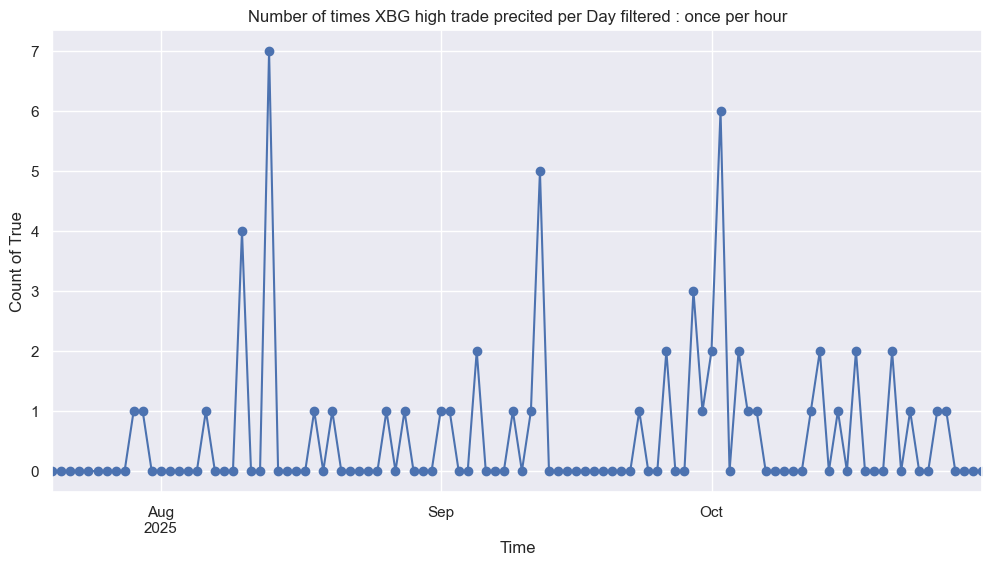

In [22]:
ser_xgb_pred = pd.Series(arr_xgb_pred, index=df_combined_condition_test.index)
ser_xgb_pred.resample("h").apply(sum_upfront_1h).resample("D").sum().plot(figsize=(12, 6), marker="o")
plt.title("Number of times XBG high trade precited per Day filtered : once per hour")
plt.xlabel("Time")
plt.ylabel("Count of True")
plt.grid(True)